In [ ]:
# One can clone the data into colaboratory, but this has to be repeated every time one runs the notebook (takes 1 GB of space)
!git clone https://github.com/BU-hammerTeam/PyHammer.git

# Alternatively one can save a sub-set of data into their google drive, and connect colaboratory with drive.
# You only need to save data once...
# Download data and latest version of code
# to access data follow the link and download
# https://drive.google.com/drive/folders/1IzcCNYb01jyBqiNzRBqmj39yfLBRWP93?usp=sharing
# Save data into drive, in the 'Astro_lab/DATA/' folder 
# you can also add a shortcut on shared with me folders.
# https://support.google.com/drive/answer/2375057?hl=en&co=GENIE.Platform%3DDesktop
# or...
# Right-click on Shared Folders or files.
# 2. Click on Download
# Downloading Status will be shown in the bottom right corner.
# 3. Goto My Drive
# 4. Right-click on the empty area and click on "Upload files" for file or "Upload folder" for the folder.
# 5. Select the location of the downloaded files and click on "Open".



Cloning into 'PyHammer'...
remote: Enumerating objects: 2892, done.
remote: Counting objects: 100% (87/87), done.
remote: Compressing objects: 100% (42/42), done.
remote: Total 2892 (delta 45), reused 87 (delta 45), pack-reused 2805
Receiving objects: 100% (2892/2892), 971.57 MiB | 23.53 MiB/s, done.
Resolving deltas: 100% (869/869), done.
Checking out files: 100% (498/498), done.


In [ ]:
!pip install specutils

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 194 kB 24.1 MB/s 
     |████████████████████████████████| 109 kB 64.7 MB/s 
     |████████████████████████████████| 401 kB 52.8 MB/s 
     |████████████████████████████████| 104 kB 51.0 MB/s 
     |████████████████████████████████| 68 kB 6.9 MB/s 
     |████████████████████████████████| 191 kB 51.7 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 61 kB 7.6 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 60 kB 8.5 MB/s 
  Created wheel for asdf-coordinates-schemas: filename=asdf_coordinates_schemas-0.1.0-py3-none-any.whl size=19019 sha256=1fa265cf3ddc7b0b2ba860da7fe47a9ad8cc4a42da5f9d0caf00cf687728a595
  Sto

In [ ]:
!pip install --upgrade plotly

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 15.2 MB 22.2 MB/s 
  Attempting uninstall: plotly
    Found existing installation: plotly 5.5.0
    Uninstalling plotly-5.5.0:
      Successfully uninstalled plotly-5.5.0


In [ ]:
# https://stackoverflow.com/questions/48376580/google-colab-how-to-read-data-from-my-google-drive
# USE THIS TO READ DATA FROM Google DRIVE
# from google.colab import drive
# drive.mount('/content/drive')

In [ ]:
from astropy.io import fits
from astropy import units as u
import numpy as np
#from matplotlib import pyplot as plt
import plotly.express as px #plotly is another -interactive- library for making plots
#from astropy.visualization import quantity_support
#quantity_support()  # for getting units on the axes below  
from specutils import Spectrum1D,SpectralRegion
from specutils.analysis import equivalent_width
import os.path

In [ ]:
#USE THIS if you called git clone and pyHAMMER
f=fits.open("PyHammer/resources/templates/M3_+0.0_Dwarf.fits")

#USE this for file in G Drive
# f=fits.open("/content/drive/My Drive/Astro_lab/DATA/M3_+0.0_Dwarf.fits")
specdata = f[1].data 
specheader = f[0].header

In [ ]:
lamb = 10**specdata['loglam'] * u.AA 
flux = specdata['flux'] * 10**-17 * u.Unit('erg cm-2 s-1 AA-1') 
spec = Spectrum1D(spectral_axis=lamb, flux=flux) 
print('------------------------------ Header ------------------------------')
print(repr(specheader))
print('---------------------------- End Header ----------------------------')

------------------------------ Header ------------------------------
SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                    8 / array data type                                
NAXIS   =                    0 / number of array dimensions                     
EXTEND  =                    T                                                  
COMMENT Photometry from 9 objects                                               
COMMENT Template made from 15 Co-added individual BOSS (SDSS) spectra           
COMMENT All added templated had -0.5 > FeH > 0.0dex                             
---------------------------- End Header ----------------------------


In [ ]:
wv_Ca_K = 3933.7 
wv_Ca_H = 3968.5 
wv_Ha = 6562.8

In [ ]:
fig=px.line(x=lamb, y=flux,labels={"x": f"Wavelength [{lamb.unit.to_string()}]","y": f"Flux [{flux.unit.to_string()}]"}, width=1000, height=300)
fig.update_layout(
    margin=dict(l=0, r=5, t=0, b=0),
    paper_bgcolor="LightSteelBlue",
)
fig.add_vline(wv_Ca_K)
fig.add_vline(wv_Ca_H)
fig.add_vline(wv_Ha)
fig

In [ ]:
def plot_spectra(spectral_type,sub_spectral_type,metalicity,line=None):
  fname=f"PyHammer/resources/templates/{spectral_type}{sub_spectral_type}_{metalicity}_Dwarf.fits"
  #USE this for file in G Drive
  # fname=f"/content/drive/My Drive/Astro_lab/DATA/{spectral_type}{sub_spectral_type}_{metalicity}_Dwarf.fits"
  if os.path.isfile(fname):
    f=fits.open(fname)
    specdata = f[1].data 
    lamb = 10**specdata['loglam'] * u.AA 
    flux = specdata['flux'] * 10**-17 * u.Unit('erg cm-2 s-1 AA-1') 
    fig=px.line(x=lamb, y=flux,labels={"x": f"Wavelength [{lamb.unit.to_string()}]","y": f"Flux [{flux.unit.to_string()}]"}, width=1000, height=300)
    fig.update_layout(
        margin=dict(l=0, r=5, t=0, b=0),
        paper_bgcolor="LightSteelBlue",
    )
    if line is not None:
      fig.add_vline(line)
    return fig
  else:
    raise ValueError(f"The template {fname} does't exist")

In [ ]:
plot_spectra("F","8","-1.5",wv_Ha)

In [ ]:
def estimate_eq(spectral_type,sub_spectral_type,metalicity,x_left1,x_left2,x_right1,x_right2,line,make_plots=True):
  fname=f"PyHammer/resources/templates/{spectral_type}{sub_spectral_type}_{metalicity}_Dwarf.fits"
  #USE this for file in G Drive
  # fname=f"/content/drive/My Drive/Astro_lab/DATA/{spectral_type}{sub_spectral_type}_{metalicity}_Dwarf.fits"
  if os.path.isfile(fname):
    f=fits.open(fname)
    specdata = f[1].data 
    lamb = 10**specdata['loglam'] * u.AA 
    flux = specdata['flux'] * 10**-17 * u.Unit('erg cm-2 s-1 AA-1') 

    wv=lamb.value
    mask_left=(wv>x_left1) & (wv<x_left2)
    mask_right=(wv>x_right1) & (wv<x_right2)
    F_left = np.mean(flux[mask_left])
    F_right = np.mean(flux[mask_right])
    wv_left=np.median(wv[mask_left])
    wv_right=np.median(wv[mask_right])

    slope= (F_right-F_left)/(wv_right-wv_left)
    continuum = slope*(wv-wv_left) + F_left

    cont_norm_spec=flux/continuum
    
    eq_est_mask=(wv>x_left2) & (wv<x_right1)
    spec_norm = Spectrum1D(spectral_axis=lamb[eq_est_mask], flux=cont_norm_spec[eq_est_mask]) 
    eq=equivalent_width(spec_norm, regions=SpectralRegion(x_left2 * u.AA, x_right1 * u.AA)) 

    if make_plots:
      fig=px.line(x=wv, y=flux,labels={"x": f"Wavelength [{lamb.unit.to_string()}]","y": f"Flux [{flux.unit.to_string()}]"}, width=1000, height=300)
      fig.update_layout(
          margin=dict(l=0, r=5, t=0, b=0),
          paper_bgcolor="LightSteelBlue",
      )
      fig.add_vrect(x0=x_left1, x1=x_left2, fillcolor="green", opacity=0.25, line_width=0)
      fig.add_vrect(x0=x_right1, x1=x_right2, fillcolor="green", opacity=0.25, line_width=0)
      fig.add_scatter(x=wv,y=continuum,mode='lines')
      display(fig)

      fig_line=px.line(x=wv[eq_est_mask], y=cont_norm_spec[eq_est_mask],labels={"x": f"Wavelength [{lamb.unit.to_string()}]","y": f"Flux [{flux.unit.to_string()}]"}, width=1000, height=300)
      fig_line.update_layout(
          margin=dict(l=0, r=5, t=0, b=0),
          paper_bgcolor="LightSteelBlue",
      )
      fig_line.add_vrect(x0=line-eq.value/2, x1=line+eq.value/2, fillcolor="red", opacity=0.25, line_width=0)
      display(fig_line)
    
    return eq
  else:
    raise ValueError(f"The template {fname} does't exist")

In [ ]:
estimate_eq("F","8","-1.5",6471,6500,6624,6650,6564)

PyHammer/resources/templates/F8_-1.5_Dwarf.fits


<Quantity 5.02397749 Angstrom>

In [ ]:
estimate_eq("F","8","-1.5",3915,3920,3945,3950,3935)

PyHammer/resources/templates/F8_-1.5_Dwarf.fits


<Quantity 4.75845707 Angstrom>

In [ ]:
import pandas as pd

In [ ]:
spectral_types=["O","B","A","F","G","K"]#,"M"]
sub_spectral_types=["0","1","2","3","4","5","6","7","8","9"]
metalicity="+0.0"#,"-1.5","-1.0","-0.5","+0.0","+0.5","+1.0"]
df = pd.DataFrame(columns=['SpectralType','Metalicity','Ha_Width','CaK_Width'])
for st in spectral_types:
  for sst in sub_spectral_types:
    try: # Check if file existss
      eqHa=estimate_eq(st,sst,metalicity,6471,6500,6624,6650,6564,make_plots=False).value
      eqCaK=estimate_eq(st,sst,metalicity,3915,3920,3945,3950,3935,make_plots=False).value
      entry = pd.DataFrame.from_dict({
        "SpectralType": [f"{st}{sst}"],
        "Metalicity":  [metalicity],
        "Ha_Width":eqHa,
        "CaK_Width":eqCaK
        })
    except:
      entry = pd.DataFrame.from_dict({
        "SpectralType": [f"{st}{sst}"],
        "Metalicity":  [metalicity],
        "Ha_Width":np.NaN,
        "CaK_Width":np.NaN
        })
    df = pd.concat([df, entry], ignore_index=True)

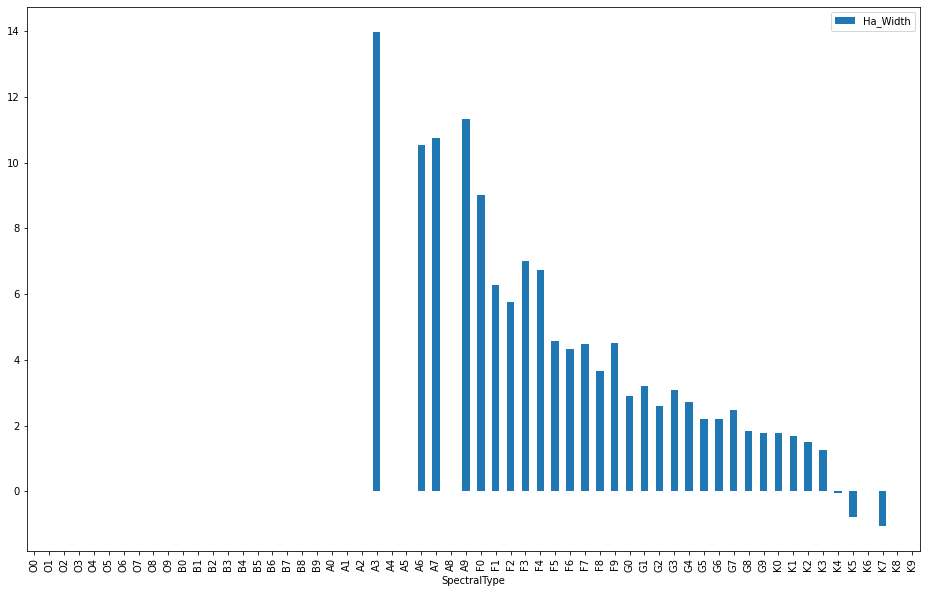

In [ ]:
df.plot.bar("SpectralType","Ha_Width",figsize=(16,10))

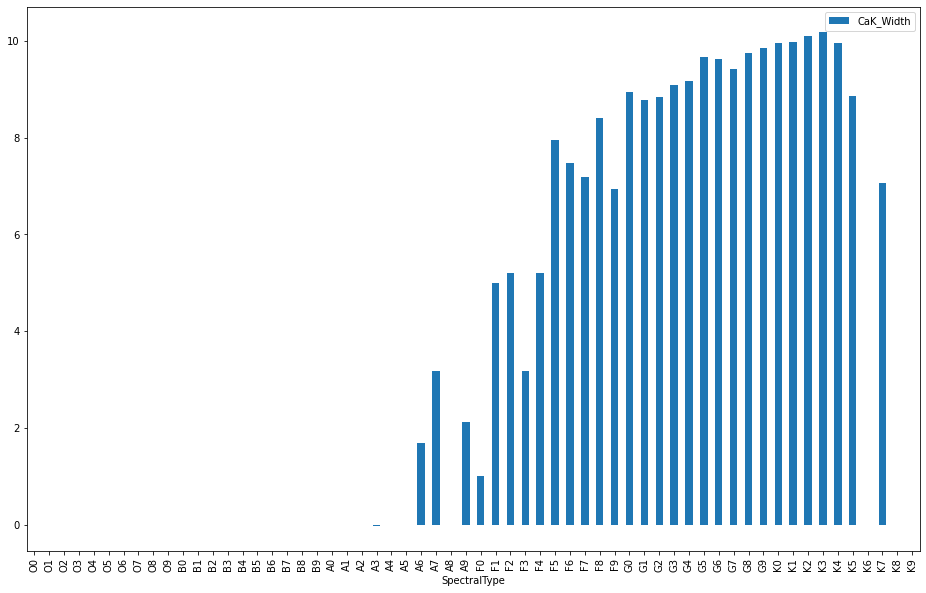

In [ ]:
df.plot.bar("SpectralType","CaK_Width",figsize=(16,10))